In [1]:
#!unzip "drive/My Drive/dog vision//dog-breed-identification.zip" -d "drive/My Drive/dog vision"

In [2]:
#pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0


In [3]:
#pip install tf_keras

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## end to end multi class Dog breed classification

##### This notebook works on end to end multi class Dog breed classification using TensorFlow Hub library from python

In [5]:
# import TensorFlow into colab
import tensorflow as tf
print(tf.__version__)

2.17.0


#### Now we need to convert our images in the form of Tensors. i.e numerical represention
#### our machine learning models only work with numerical features and learn patters from them. so we need to convert our dataset images into numerical features

#### In the form of csv file, we have labels of our data. lets check our data using pandas

In [6]:
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/dog vision/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [7]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [8]:
# how many images are there of each breed?
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


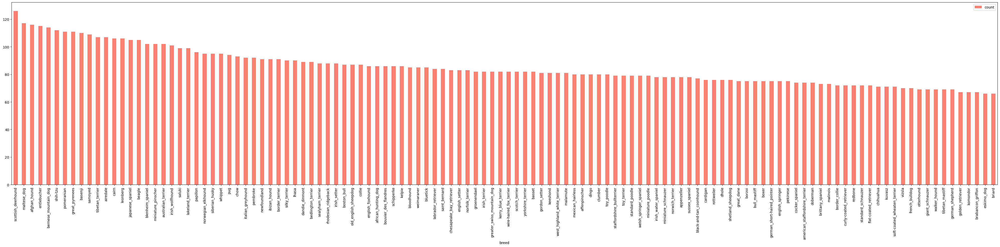

In [9]:
#lets visualize this
import matplotlib.pyplot as plt
labels_csv["breed"].value_counts().plot(kind="bar",figsize=(40,10),color="salmon")
plt.tight_layout()
plt.legend()
plt.show()

In [10]:
#lets calculate mean no of images per breed
labels_csv["breed"].value_counts().mean()

85.18333333333334

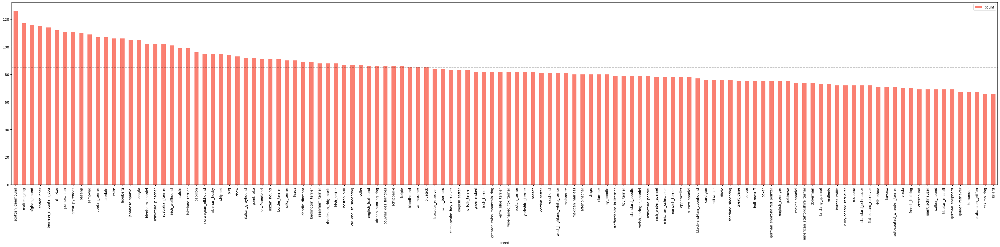

In [11]:
#lets draw a line to our barplot with mean
#lets visualize this
import matplotlib.pyplot as plt
labels_csv["breed"].value_counts().plot(kind="bar",figsize=(40,10),color="salmon")
#code for mean
plt.axhline(labels_csv["breed"].value_counts().mean(),color="black",linestyle="--")
plt.tight_layout()
plt.legend()
plt.show()

In [12]:
#lets describe no of images per breed
labels_csv["breed"].value_counts().describe()

,count
count,120.000000
mean,85.183333
std,13.298122
min,66.000000
25%,75.000000
50%,82.000000
75%,91.250000
max,126.000000


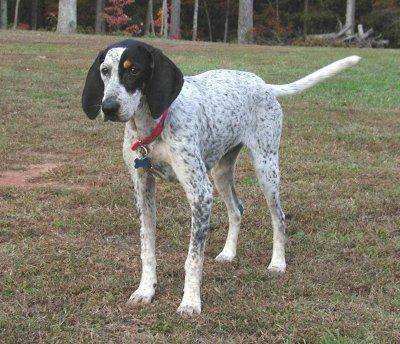

In [13]:
# lets view an image
from IPython.display import Image
Image("drive/My Drive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

In [14]:
# now, lets create filepaths for all ids in the labels_csv
filenames=["drive/My Drive/dog vision/train/"+id+".jpg" for id in labels_csv["id"]]

In [15]:
#lets view first 10 filenames
filenames[:10]

['drive/My Drive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## Lets check whether our list filenames is equal to the length of our train dataset
##This is really very important step because, if anything goes wrong after this step failure we need to start the process from scrach

In [16]:
import os
if len(os.listdir("drive/My Drive/dog vision/train/")) == len(filenames):
  print("filenames lists size is equal to our train data files. proceed!")
else:
  print("filenames lists size doesnot equal to actual size of train data file.Check the target directory.")

filenames lists size is equal to our train data files. proceed!


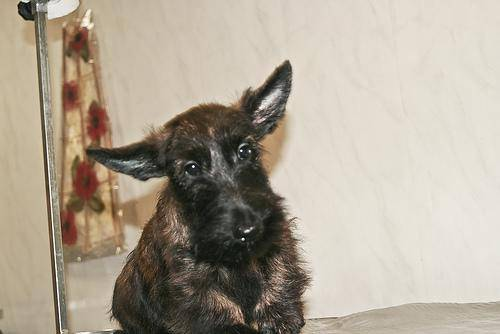

In [17]:
## lets check if we are dealing with images or not. lets randomly take a file path from filenames list and check its image
import random
random_index=random.randint(0,len(filenames))
Image(filenames[random_index])


In [18]:
random_index

5581

In [19]:
# Lets check the breed of above dog.
labels_csv["breed"][random_index]

'scotch_terrier'

In [20]:
import numpy as np
labels=labels_csv["breed"]
labels=np.array(labels)
len(labels)

10222

In [21]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [22]:
if len(labels) == len(filenames):
  print("labels lists size is equal to our train data files. proceed!")
else:
  print("labels lists size doesnot equal to actual size of train data file.Check the target directory.")

labels lists size is equal to our train data files. proceed!


In [23]:
# Lets find the unique breeds
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [24]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [25]:
#here we will find true only at one area. left all are false.
print(labels[0]==unique_breeds)

[False False False False False False False False False False False False
 False False False False False False False  True False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]


In [26]:
# since len(labels)>10000 and len(unique_breeds)==120, let us create an above array for every label in labels.
# so it creates a same above array > 10000.
boolean_labels=[i == unique_breeds for i in labels]
boolean_labels[0:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [27]:
len(boolean_labels)

10222

In [28]:
len(labels)==len(boolean_labels)

True

In [29]:
## let us get the first breed from labels array
print(labels[0])

boston_bull


In [30]:
#  for boston_bull breed, we are going to check the index of boston_bull in unique_breeds array
print(np.where(unique_breeds == labels[0]))

(array([19]),)


In [31]:
# so, 19th breed is boston_bull

In [32]:
# Similarly, we have boolean_labels array that is eual to labels array but in the format of boolean
# we are going to get index where True occurs
print(boolean_labels[0].argmax())

19


In [33]:
# Now, lets convert our boolean_labels first array from boolean to integer type
print(boolean_labels[0].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [34]:
# In the above code we can check where 1 occurs
# Lets try to convert another boolean_labels into integer format
print(boolean_labels[10].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [35]:
np.array(boolean_labels).shape


(10222, 120)

## Let us start Experimenting with 1000 images and we can increase them if needed.

In [36]:
#let use slider for no of images to work with

#let us work by using slider
NUM_IMAGES = 1000 # @param {"type":"slider","min":1000,"max":10000,"step":1000}

In [37]:
x=filenames
y=boolean_labels

In [38]:
from sklearn.model_selection import train_test_split
np.random.seed(42)
x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)


In [39]:
len(x_train),len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [40]:
#lets check our data given for training
x_train[:5],y_train[:5]

(['drive/My Drive/dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

#### In the above code, x_train is nothing but the images and y_train is nothing but corresponding label

### Now , we need to convert our images into numerical format
#### i.e we are preprocessing our images . we are turning our images into Tensors(numericals)
In this preprocessing, we are going to create a function so that a same piece .of code will be used for every image that are going to convert into tensors.
1. We will take an image path as input.
2. We use TensorFlow to read the image and assign it to a variable .
3. We will turn our variable i.e image into a Tensors.
4. Now Normalize our images.i.e convert color channel values from 0-255 to 0-1.
4. In the next step we are going to resize all our images since each image is of different size.
5. The size will be (224,224).
6. Then we are going to return the modified image.

array([[[170, 160, 150],
        [170, 160, 150],
        [170, 160, 150],
        ...,
        [173, 159, 150],
        [173, 159, 150],
        [173, 159, 150]],

       [[170, 160, 150],
        [170, 160, 150],
        [170, 160, 150],
        ...,
        [173, 159, 150],
        [173, 159, 150],
        [173, 159, 150]],

       [[170, 160, 150],
        [170, 160, 150],
        [170, 160, 150],
        ...,
        [174, 160, 151],
        [174, 160, 151],
        [174, 160, 151]],

       ...,

       [[196, 188, 177],
        [195, 187, 176],
        [195, 187, 176],
        ...,
        [182, 172, 162],
        [182, 172, 162],
        [182, 172, 162]],

       [[196, 188, 177],
        [195, 187, 176],
        [195, 187, 176],
        ...,
        [182, 172, 162],
        [182, 172, 162],
        [182, 172, 162]],

       [[196, 188, 177],
        [195, 187, 176],
        [195, 187, 176],
        ...,
        [182, 172, 162],
        [182, 172, 162],
        [182, 172, 162]]], dtype=uint8)
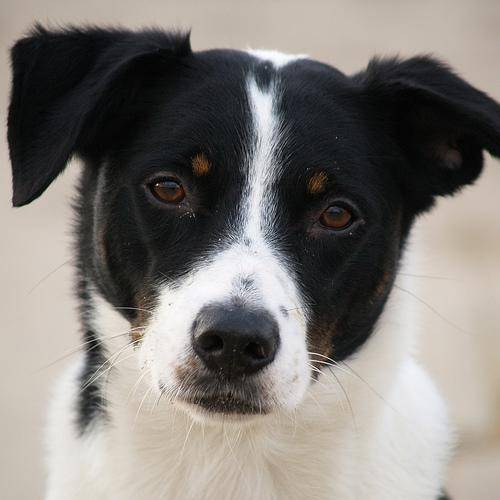

In [41]:
# Initially we will check our image looks like
from matplotlib.pyplot import imread
image=imread(filenames[78])
image

In [42]:
image.shape

(500, 500, 3)

In [43]:
image.max()

255

In [44]:
image.min()

0

In [45]:
image[:2]

array([[[170, 160, 150],
        [170, 160, 150],
        [170, 160, 150],
        ...,
        [173, 159, 150],
        [173, 159, 150],
        [173, 159, 150]],

       [[170, 160, 150],
        [170, 160, 150],
        [170, 160, 150],
        ...,
        [173, 159, 150],
        [173, 159, 150],
        [173, 159, 150]]], dtype=uint8)

In [46]:
import tensorflow as tf

In [47]:
#Turn image into tensors
tf.constant(image)[:2]
#Above code takes the image and converts the image into a long tensor. it will be like a long string.
#we cannot understand anything from it. but, out computer understands a lot better from it.

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[170, 160, 150],
        [170, 160, 150],
        [170, 160, 150],
        ...,
        [173, 159, 150],
        [173, 159, 150],
        [173, 159, 150]],

       [[170, 160, 150],
        [170, 160, 150],
        [170, 160, 150],
        ...,
        [173, 159, 150],
        [173, 159, 150],
        [173, 159, 150]]], dtype=uint8)>

In [48]:
IMG_SIZE=224
# Now, lets create a function
def process_image(image_path,img_size=IMG_SIZE):
  """ takes the image file path and turns into a tensor"""
  ### read an image filepath
  image=tf.io.read_file(image_path)
  ### convert the image into tensor susing 3 channel color
  image=tf.image.decode_jpeg(image,channels=3)
  ## now this color channel values are converted fom 0-255 to 0-1
  image=tf.image.convert_image_dtype(image,tf.float32)
  ### now resize the image
  image=tf.image.resize(image, size=(IMG_SIZE,IMG_SIZE))
  return image

In [49]:
#lets check line by line how the function works

tensor=tf.io.read_file(filenames[34])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\x97\x02R\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [50]:
#now , that converted tensor is in the form of string. we need to convert it in the form  of numericals
tensor=tf.image.decode_jpeg(tensor,channels=3)
tensor

<tf.Tensor: shape=(407, 594, 3), dtype=uint8, numpy=
array([[[ 22,  25,  30],
        [ 21,  24,  29],
        [ 32,  35,  40],
        ...,
        [206, 199, 183],
        [205, 198, 182],
        [205, 198, 182]],

       [[ 39,  42,  47],
        [ 23,  26,  31],
        [ 36,  39,  44],
        ...,
        [206, 199, 183],
        [205, 198, 182],
        [205, 198, 182]],

       [[ 28,  32,  35],
        [ 19,  23,  26],
        [ 31,  35,  38],
        ...,
        [206, 199, 183],
        [205, 198, 182],
        [205, 198, 182]],

       ...,

       [[ 42,  46,  49],
        [ 50,  54,  57],
        [ 52,  56,  59],
        ...,
        [  2,   9,  19],
        [  7,  11,  20],
        [  7,  11,  20]],

       [[ 32,  36,  39],
        [ 40,  44,  47],
        [ 46,  50,  53],
        ...,
        [  4,  11,  21],
        [  7,  11,  20],
        [  7,  11,  20]],

       [[ 21,  25,  28],
        [ 25,  29,  32],
        [ 32,  36,  39],
        ...,
        [  7,  14,  2

In [51]:
# Now, our color channel values are converted rom 0-255 to 0-1.
tensor=tf.image.convert_image_dtype(tensor,tf.float32)
#you can see the values in between 0-1. that are actually scaled from 0-255 to 0-1.
#we actually do this to make our gpu to work more efficient.
#It is called as Normalization.
tensor

<tf.Tensor: shape=(407, 594, 3), dtype=float32, numpy=
array([[[0.08627451, 0.09803922, 0.11764707],
        [0.08235294, 0.09411766, 0.1137255 ],
        [0.1254902 , 0.13725491, 0.15686275],
        ...,
        [0.8078432 , 0.7803922 , 0.7176471 ],
        [0.80392164, 0.77647066, 0.7137255 ],
        [0.80392164, 0.77647066, 0.7137255 ]],

       [[0.15294118, 0.16470589, 0.18431373],
        [0.09019608, 0.10196079, 0.12156864],
        [0.14117648, 0.15294118, 0.17254902],
        ...,
        [0.8078432 , 0.7803922 , 0.7176471 ],
        [0.80392164, 0.77647066, 0.7137255 ],
        [0.80392164, 0.77647066, 0.7137255 ]],

       [[0.10980393, 0.1254902 , 0.13725491],
        [0.07450981, 0.09019608, 0.10196079],
        [0.12156864, 0.13725491, 0.14901961],
        ...,
        [0.8078432 , 0.7803922 , 0.7176471 ],
        [0.80392164, 0.77647066, 0.7137255 ],
        [0.80392164, 0.77647066, 0.7137255 ]],

       ...,

       [[0.16470589, 0.18039216, 0.19215688],
        [0.19

In [52]:
#Now, we are going to resize our image in the format of(224,224).
tensor=tf.image.resize(tensor,size=(IMG_SIZE,IMG_SIZE))
tensor

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.09042301, 0.10218772, 0.12179556],
        [0.11473363, 0.12649834, 0.14610618],
        [0.09272581, 0.10449051, 0.12409835],
        ...,
        [0.8196079 , 0.79215693, 0.7294118 ],
        [0.8136382 , 0.78618723, 0.7234421 ],
        [0.80392164, 0.77647066, 0.7137255 ]],

       [[0.08168886, 0.09737513, 0.10913984],
        [0.09317888, 0.10886515, 0.12062985],
        [0.1127224 , 0.12840867, 0.14017338],
        ...,
        [0.8196079 , 0.79215693, 0.7294118 ],
        [0.8136382 , 0.78618723, 0.7234421 ],
        [0.80480576, 0.7773548 , 0.7146096 ]],

       [[0.1778584 , 0.19354467, 0.20530938],
        [0.10785257, 0.12353884, 0.13530354],
        [0.17694902, 0.1926353 , 0.2044    ],
        ...,
        [0.8196079 , 0.79215693, 0.7294118 ],
        [0.8136382 , 0.78618723, 0.7234421 ],
        [0.8078432 , 0.7803922 , 0.7176471 ]],

       ...,

       [[0.14830667, 0.16399294, 0.17575765],
        [0.15

In [53]:
#lets bring our function back that was written above and work with it
IMG_SIZE=224
# Now, lets create a function
def process_image(image_path,img_size=IMG_SIZE):
  """ takes the image file path and turns into a tensor"""
  ### read an image filepath
  image=tf.io.read_file(image_path)
  ### convert the image into tensor susing 3 channel color
  image=tf.image.decode_jpeg(image,channels=3)
  ## now this color channel values are converted fom 0-255 to 0-1
  image=tf.image.convert_image_dtype(image,tf.float32)
  ### now resize the image
  image=tf.image.resize(image, size=(IMG_SIZE,IMG_SIZE))
  return image

##        Turning our data into Batches
#### Now, we are going to turn our data into batches.
#### Though we are using a GPU in the backend this is going to take a lot of memory if we use 10000+ images at a time without using batches.
#### If we dont convert our data into batches will break everything.
#### The standard batch size in deep learning is 32. i.e we are going to take 32 images at a time.rather than 10000+ images in one go.
#### For that 32 images i.e 1 batch we are going to train then we go for next 32 images.i.e next batch.
#### In order to use our TensorFlow effectively, we need our images in the form of tensor tuples which look like this : (image,label).

#### So, in the above function we have processed our image in multiple steps.
#### Now , we need to wrir=te another function thats going to return a tuple with returns a image and its asociated label
#### i.e (image,label)
#### Here, image is the processed image and label means the label associated to that file path.

In [54]:
# lets create a function that takes image and preprocess the image and returns a tuple i.e (image,tuple)
def get_image_label(image_path,label):
  """
  Takes an image file path name and the associated lable,
  processes the image and return a (image,label) tuple.

  """
  image = process_image(image_path,img_size=IMG_SIZE)
  return image,label

In [55]:
# Now, lete create a demo image for our above codes.
#i.e we have x as filename and y as boolean_labels




In [56]:
x

['drive/My Drive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/My Drive/dog vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/My Drive/dog vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/My Drive/dog vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/My Drive/dog vision/train/006cc3ddb9dc1bd82

In [57]:
y

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [58]:
get_image_label(x[32],y[32])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[2.1821149e-02, 9.6624352e-02, 3.9579429e-02],
         [3.1774971e-01, 3.9849764e-01, 3.4007537e-01],
         [1.9432701e-02, 7.9156667e-02, 2.5785400e-02],
         ...,
         [0.0000000e+00, 2.8685225e-02, 7.3815696e-03],
         [1.9170513e-03, 4.3444425e-02, 1.0881329e-02],
         [1.4592139e-02, 6.1650965e-02, 2.2435278e-02]],
 
        [[1.0875124e-01, 1.8718261e-01, 1.4012378e-01],
         [1.7272735e-04, 4.8262980e-02, 1.3897762e-03],
         [6.4935260e-02, 1.2673499e-01, 8.3912849e-02],
         ...,
         [1.0160362e-04, 1.2352975e-02, 9.8086741e-05],
         [1.2390460e-02, 5.1494777e-02, 2.0159349e-02],
         [2.1063086e-02, 6.0197882e-02, 2.8852297e-02]],
 
        [[5.7045318e-02, 1.2597509e-01, 7.8916252e-02],
         [1.0413458e-02, 6.4111114e-02, 2.4974126e-02],
         [1.2249038e-02, 6.4907044e-02, 2.5636028e-02],
         ...,
         [2.1364415e-02, 4.3656677e-02, 1.5458719e-02],


In [59]:
## now lets define our batch size as 32.
BATCH_SIZE = 32
## Now we need to create the batches for our test,validation and train data
## we need to write a function for conversion of our data into batches
## we need to write a function for conversion of our data into batches

def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  here we put y=None because if we ae dealing with test data we are not going to use the labels."""
  #Here, training data is shuffled in the pairs as (image,label) so that though the order of the data gets changed, the relatonship between the image and label remains the same
  # if our data is test data, we definitly dont have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) #i.e only filepaths since no labels for test data
    # The above code says that its going to create the dataset from tensor slices by usinf x. ie by converting x into tesonrs.
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    #The above is going to convert our data initially 32 images in 1 batch and the processes next 32 images if there.
    return data_batch
  #If our data is validation data, we need not to shuffle our data
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))#i,e we also ahve labels for valid data
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  else:

    #we are going to deal with training data

    # i.e if valid _data is False and test_data is also False
    print("Creating training data batches....")

    #Since our data is training data, we need to shuffle it

    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data=data.shuffle(buffer_size=len(x))
    data=data.map(get_image_label)
    data_batch=data.batch(BATCH_SIZE)
  return data_batch









### One thing we should always remember is , x means the images and y means the boolean_labels

In [60]:
#Lets create training batch
train_data=create_data_batches(x_train,y_train)
train_data

Creating training data batches....


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [61]:
#Lets create validation batch
val_data=create_data_batches(x_val,y_val,valid_data=True)
val_data

Creating validation data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [62]:
#Lets create a numpy array
new_array = np.array([1,4,8,15,9,5,12,14,6])
new_array

array([ 1,  4,  8, 15,  9,  5, 12, 14,  6])

In [63]:
## for the above numpy array, we will use the argmax().
new_array.argmax()

3

In [64]:
## That means , argmax() returns us the index of maximum value in an array


In [65]:
# Now, lets understand it for our labels array
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [66]:
# Y is the boolean labelling for the entire dataset
y

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [67]:
#Now, lets get y[0]
# We can see True at one position. we need to know what is the breed name for that position.
y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [68]:
## We will use argmax to know the index where we are returning True
y[0].argmax()

19

In [69]:
#At index 19, we are getting True as output.
# We need to know what actually is at 19th index from unique_breeds since we have at 19th index in that array
unique_breeds[19]

'boston_bull'

In [70]:
unique_breeds[y[0].argmax()]

'boston_bull'

### Next, we are going to visualizre our batches since it is complex to understand as we see.
### Before visualizing, lets work on "argmax" in python.
### We will check how we are getting the labels wrt the argmax

### Visualizing our data batches
##### Now, we have our data in the form of batches. However, understanding this data of batches in hard. So, lets visualize our data using matplotlib

In [71]:
import matplotlib.pyplot as plt


In [72]:
#create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  This function plots data 25 images from the data batch,
  """
  #setup the figure
  plt.figure(figsize=(10,10))
  #loop through 25 images
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.axis("off")
    plt.title(unique_breeds[labels[i].argmax()])



In [73]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [74]:
# So, this is going to take our train data batch and going to unwind it from a batch and turn it into a numpy iterator
# "next" is going to grab our first batch data
train_images,train_labels = next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[7.17647076e-01, 8.50980461e-01, 9.49019670e-01],
          [7.17647076e-01, 8.50980461e-01, 9.49019670e-01],
          [7.17647076e-01, 8.50980461e-01, 9.49019670e-01],
          ...,
          [7.25490212e-01, 8.50980461e-01, 9.41176534e-01],
          [7.25490212e-01, 8.50980461e-01, 9.41176534e-01],
          [7.17647076e-01, 8.54902029e-01, 9.41176534e-01]],
 
         [[7.17647076e-01, 8.50980461e-01, 9.49019670e-01],
          [7.17647076e-01, 8.50980461e-01, 9.49019670e-01],
          [7.17647076e-01, 8.50980461e-01, 9.49019670e-01],
          ...,
          [7.25490212e-01, 8.50980461e-01, 9.41176534e-01],
          [7.25490212e-01, 8.50980461e-01, 9.41176534e-01],
          [7.17647076e-01, 8.54902029e-01, 9.41176534e-01]],
 
         [[7.17647076e-01, 8.50980461e-01, 9.49019670e-01],
          [7.17647076e-01, 8.50980461e-01, 9.49019670e-01],
          [7.17647076e-01, 8.50980461e-01, 9.49019670e-01],
          ...,
          [7.25490212e-01, 8.50980461e-01, 9.4117

In [75]:
# The length of train_images and train_labels will have a size of 32. i.e BATCH_SIZE
len(train_images),len(train_labels)


(32, 32)

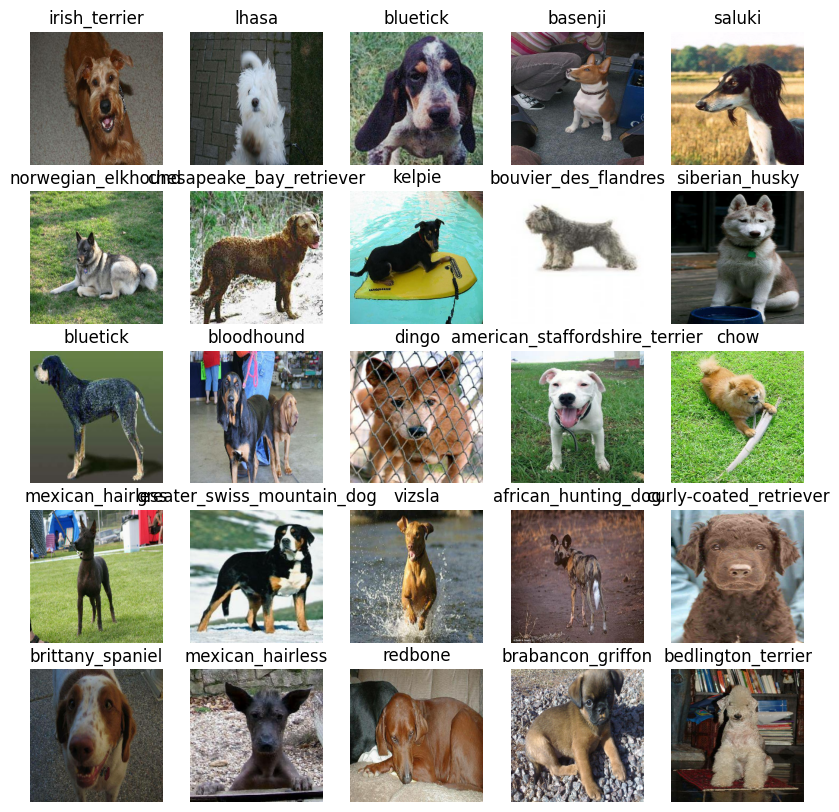

In [76]:
#Lets visualize our data
train_images,train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

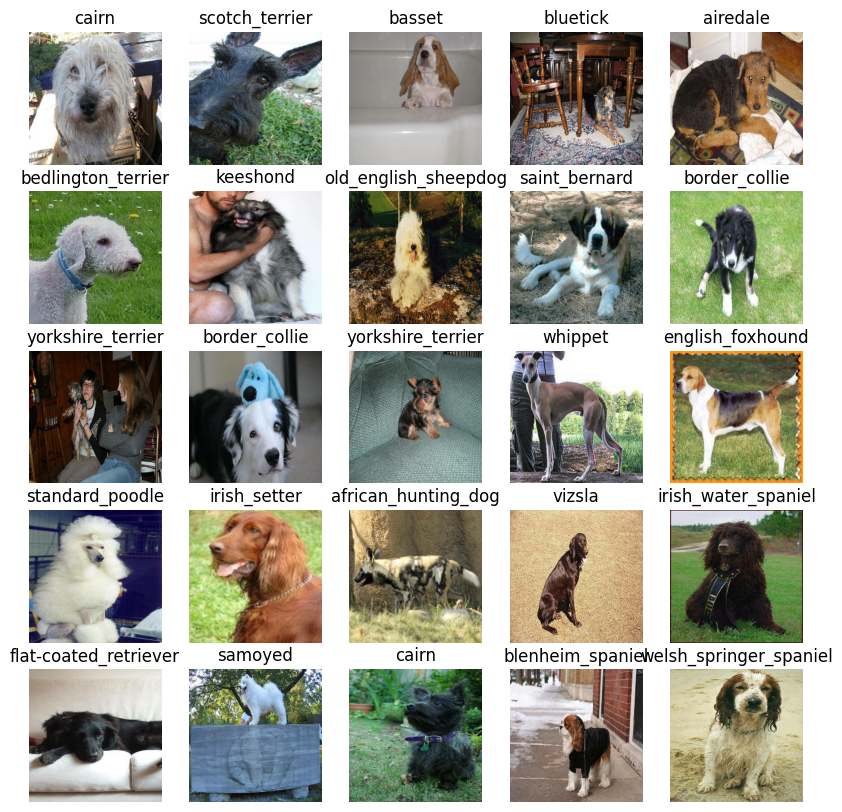

In [77]:
#lets visualize our validation data
val_images,val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model
#### Now, we will built the model .Before building the model, there are few things needed to be considered
#### 1. The input shape of our model.(our image shape in the form of Tensors)
#### 2. The output shape of our model.(image labels, in the form of tensors)
#### 3. The URL of the model we want to use: "https://tfhub.dev/google/imagenet/inception_v3/feature_vector/5"

In [78]:
IMG_SIZE=224
#Setup input shape for our model
#batch,height,width,color channels
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3]
#setup output shape for our model
OUTPUT_SHAPE=len(unique_breeds)
#setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"




#### We have got our inouts,outputs and model.Lets put them together into a keras deep learning model

### Lets create a function that takes input shape , output shape and model we have chosen .
### Defines the layer in the keras modelin sequential fashion.
### i.e that means do this first,then this , then that ...
### Compiles the model. (says it should be evaluated and improved)
### Builds the model (tells the model input shape it will be getting.)
### return the model
https://www.tensorflow.org/guide/keras

In [79]:
#pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

In [80]:
#pip install tf_keras


In [81]:
import tf_keras

In [82]:
import tensorflow_hub as hub

In [83]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", model_url)
  # Setup the model layers
  model = tf_keras.Sequential([hub.KerasLayer(model_url),
  tf_keras.layers.Dense(units=output_shape,activation="softmax")  ])

  # Compile the model
  model.compile(loss=tf_keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
  optimizer=tf_keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
  metrics=["accuracy"]    )


  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  return model

In [84]:
model = create_model()
model

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [85]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## creating callbacks.
callbacks are helper functions a model can use during training to do such things as save its progress , check its progress or stop training model if a model stops improving

we will create two callbacks.
1. one for TensorBoard which helps track our model.
2. another for early stopping which prevents our model from training for too long.
**Note** : Tensorboard is like a dashboard for seeing how well our model is doing. i.e seeing the loss function



### TensorBoard Callback
## To create a TensorBoard call abck we need to do 3 things. they are:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our models "fit()" function.
3. Visualize our models training logs with the '%tensorboard' magic function. ( we will do this after model training).

In [86]:
#load Tensorboard notebook extension
%load_ext tensorboard

In [87]:
import datetime
# create a function to create a tensorflow callback
def create_tensorboard_callback():
  #Create a log directory for storing tensorboard logs
  logdir=os.path.join("drive/My Drive/dog vision/logs",
                      #make it so the logs get tracked whenever we run the experiment
                      datetime.datetime.now().strftime("Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)


### lets create early stopping call back
###we stop our model from getting trained when a certain evaluaton metric stps improving.
###that means training a lot on certain dataset perform well on that dataset but fails on another data set. i.e over fitting.


In [88]:
#create a early stopping call back function
early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model(on the subset)
Our first model is only going to train on 1000 images, to make sure everything is working

In [89]:
#Epochs is nothing but we are giving our model no of chances to go and learn from the train data
NUM_EPOCHS=100 #@param {type :"slider",min : 10,max : 100,step : 10}


In [90]:
#check whether we are connected to the GPU or not because, if we forget, our model is going to consume lot of time.
print("GPU", "available (YES!!!!!)" if tf.config.list_physical_devices("GPU") else "Not Available!!")

GPU available (YES!!!!!)


###lets create a function which trains the model
1. create a model using create_model()
2. Setup a TensorBoard callback using  "create_tensorboard_callback()"
3. Call the fit() function on our model passing it the training data,validation data,no of epochs to train for ('NUM_EPOCHS') and the callbacks we would like to use
4. Return the model

In [91]:
#build the function to train and return the train model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  #Create a model
  model = create_model()
  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()
  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,validation_freq=1,callbacks=[tensorboard, early_stopping])
  # return the model
  return model


In [92]:
model=train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 214s 250ms/step - loss: 4.5405 - accuracy: 0.1000 - val_loss: 3.3923 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 4s 144ms/step - loss: 1.6139 - accuracy: 0.6925 - val_loss: 2.1070 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 5s 194ms/step - loss: 0.5600 - accuracy: 0.9362 - val_loss: 1.5957 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 4s 144ms/step - loss: 0.2515 - accuracy: 0.9875 - val_loss: 1.4283 - val_accuracy: 0.6600
Epoch 5/100
25/25 [==============================] - 5s 185ms/step - loss: 0.1457 - accuracy: 0.9962 - val_loss: 1.3502 - val_accuracy: 0.6750
Epoch 6/100
25/25 [==============================] - 4s 143ms/step - loss: 0.0994 - accuracy: 1.0000 - val_loss: 1.3030 - val_accuracy: 0.7050
Epoch 7/100
25/25 [===========================

### Because of the early stopping, our model stopped at the Epoch 10. We can obswrve our model has an accuracy of 100% on the training data and EPoch 10. But, our models validation accuracy is 67%. there is a huge difference in both of the accuracies. That means our model is overfitting.

### Q) What are the some ways how we can stop the overfitting on our deep learning overfitting model?

## **Note** : Firstly, we need to know that we are on the right track . Overitting indicates that our model is learning . overfitting is actually a good thing.

### checking the tensorboard logs
###The TensorBoard magic function  (%tensorboard) will access the logs directory we created earlier and visualize its contents


In [93]:
%tensorboard --logdir drive/My\ Drive/dog\ vision/logs

<IPython.core.display.Javascript object>

###Let's evaluate our model.
we can see the output in the form of softmax.

## **Softmax Function**
The softmax function is a function that turns a vector of K real values into a vector of K real values that sum to 1. The input values can be positive, negative, zero, or greater than one, but the softmax transforms them into values between 0 and 1, so that they can be interpreted as probabilities.


In [94]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [95]:
#we need to make predictions on the train data
predictions= model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 2s 155ms/step


array([[1.40549068e-03, 1.10460714e-04, 3.96581879e-03, ...,
        5.81759145e-04, 6.51651135e-05, 2.80118268e-03],
       [8.28960270e-04, 4.14056377e-03, 6.99998485e-03, ...,
        9.22793290e-04, 6.18204067e-04, 2.88681767e-05],
       [5.21239381e-05, 2.19164693e-04, 5.06701217e-05, ...,
        1.01999714e-04, 1.60308846e-04, 2.18961528e-03],
       ...,
       [5.83293786e-06, 5.00291499e-05, 2.39432575e-06, ...,
        4.38554071e-06, 6.74565963e-05, 6.49897493e-06],
       [7.75505323e-03, 1.74817309e-04, 4.36593604e-04, ...,
        1.03937404e-03, 9.00698069e-05, 1.66514013e-02],
       [2.51114368e-03, 3.06493821e-05, 7.13659450e-04, ...,
        1.12731499e-03, 1.14761374e-03, 1.21641620e-04]], dtype=float32)

### Our val data is nothing but the out of the 1000 images, 200 images is our val data and 800 were our train data


In [96]:
#so, we are going to find the shape of predictions of our 200 validation images.
# there will be 200 numpy arrays of size 120 each.
predictions.shape

(200, 120)

In [97]:
#lets know about our first prediction
#it will be a numpy array of size 120

predictions[0]

array([1.40549068e-03, 1.10460714e-04, 3.96581879e-03, 2.16715707e-04,
       5.03877382e-05, 8.57299237e-05, 1.36030950e-02, 4.97658330e-04,
       1.11458910e-04, 7.97319866e-04, 9.42162238e-04, 6.83490725e-05,
       3.31269810e-04, 4.66381432e-04, 1.48915700e-04, 3.45618813e-04,
       4.27643317e-05, 8.41876194e-02, 2.40648060e-05, 1.64361612e-04,
       1.38987158e-03, 6.85676569e-05, 2.03339205e-05, 1.82408618e-03,
       1.13164424e-04, 6.05316076e-04, 2.10912809e-01, 1.05074979e-03,
       1.05754356e-04, 1.96388632e-04, 4.29734064e-05, 1.70887681e-03,
       1.82518314e-04, 6.61012964e-05, 4.08951717e-04, 1.28614232e-02,
       3.96731666e-05, 1.73620894e-04, 1.48190491e-04, 3.70297821e-05,
       7.29892578e-04, 4.66438578e-05, 1.96815003e-04, 9.55474679e-05,
       2.55992927e-05, 2.48214259e-04, 7.52558626e-05, 2.91747041e-04,
       3.71194677e-04, 4.80458693e-04, 4.77094291e-04, 5.33841194e-06,
       7.72075786e-04, 1.94414664e-04, 6.57318524e-05, 1.26427285e-05,
      

In [98]:
#now, lets sum up the predictions[0]. we will get the answer as closer to one because in our model we have used softmax because we are working on multiclass classification problem
np.sum(predictions[0])

0.99999994

##**NOTE** :
## 1. If our problem definition is Binary classification,our activation will be Sigmoid. our loss will be Binary Crossentropy.
## 2. If our problem definition if Multi-class Classification, our activation will be Softmax. Our loss will be Categorical Crossentropy.

Above, we have seen that that np.sum(predictions[0]) is somewhere closer to 1 because of the softmax. that makes our process much more efficient.
### Lets work on our first prediction more detailingly
The max value in our predicted array is the predicted label

In [99]:
#prediction 1
index=0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"sum: {np.sum(predictions[index])}")
print(f"Max index position : {np.argmax(predictions[index])}")
print(f"Predicted label : {unique_breeds[np.argmax(predictions[index])]}")

[1.40549068e-03 1.10460714e-04 3.96581879e-03 2.16715707e-04
 5.03877382e-05 8.57299237e-05 1.36030950e-02 4.97658330e-04
 1.11458910e-04 7.97319866e-04 9.42162238e-04 6.83490725e-05
 3.31269810e-04 4.66381432e-04 1.48915700e-04 3.45618813e-04
 4.27643317e-05 8.41876194e-02 2.40648060e-05 1.64361612e-04
 1.38987158e-03 6.85676569e-05 2.03339205e-05 1.82408618e-03
 1.13164424e-04 6.05316076e-04 2.10912809e-01 1.05074979e-03
 1.05754356e-04 1.96388632e-04 4.29734064e-05 1.70887681e-03
 1.82518314e-04 6.61012964e-05 4.08951717e-04 1.28614232e-02
 3.96731666e-05 1.73620894e-04 1.48190491e-04 3.70297821e-05
 7.29892578e-04 4.66438578e-05 1.96815003e-04 9.55474679e-05
 2.55992927e-05 2.48214259e-04 7.52558626e-05 2.91747041e-04
 3.71194677e-04 4.80458693e-04 4.77094291e-04 5.33841194e-06
 7.72075786e-04 1.94414664e-04 6.57318524e-05 1.26427285e-05
 1.76748770e-04 5.17257070e-03 4.26335173e-04 3.33425283e-01
 1.39404714e-04 6.78504221e-05 1.16648189e-04 9.65148956e-06
 4.55114146e-04 8.275781

In [100]:
#lets check the actual label from unique_breeds
print(f"The actual label is : {unique_breeds[26]}")

The actual label is : cairn


In [101]:
#prediction 2
index2=36
print(predictions[index2])
print(f"Max value (probability of prediction): {np.max(predictions[index2])}")
print(f"sum: {np.sum(predictions[index2])}")
print(f"Max index position : {np.argmax(predictions[index2])}")
print(f"Predicted label : {unique_breeds[np.argmax(predictions[index2])]}")

[2.48111919e-05 1.69053994e-04 1.53072197e-05 8.44881069e-05
 1.88805625e-05 6.20178398e-05 1.32723522e-04 4.16309667e-05
 2.89754178e-02 2.56960455e-04 1.51748871e-04 4.62203199e-04
 8.79217987e-05 4.78711631e-03 2.97991955e-03 1.75307359e-04
 7.35131325e-05 1.71727406e-05 1.64759776e-03 4.65760313e-05
 2.39748733e-05 4.62300159e-05 6.83750613e-06 3.59373720e-04
 1.09073512e-01 8.10947859e-06 2.47268144e-05 4.79915871e-05
 4.77729249e-04 9.06576861e-06 4.19642514e-04 3.40345403e-04
 9.02485568e-03 5.59690641e-04 2.08732636e-05 1.59314332e-05
 3.13867728e-04 6.56615011e-05 1.22525104e-04 1.04442437e-03
 5.19379228e-03 8.95224861e-04 2.15473672e-04 1.56322185e-05
 1.06733642e-04 1.72395921e-05 2.25099764e-04 6.32050360e-05
 2.35905118e-05 6.50962722e-03 5.70427801e-04 1.70774965e-05
 3.46813249e-05 1.75918831e-04 4.28632702e-05 1.16970587e-04
 7.68454745e-03 1.94171400e-04 2.35363987e-05 1.14629984e-04
 1.79222388e-05 4.53793182e-05 2.23744109e-06 9.00573377e-06
 8.19326669e-05 5.194203

In [102]:
#lets check the actual label from unique_breeds
print(f"The actual label is : {unique_breeds[115]}")

The actual label is : welsh_springer_spaniel


In [103]:
#prediction 3
index3=46
print(predictions[index3])
print(f"Max value (probability of prediction): {np.max(predictions[index3])}")
print(f"sum: {np.sum(predictions[index3])}")
print(f"Max index position : {np.argmax(predictions[index3])}")
print(f"Predicted label : {unique_breeds[np.argmax(predictions[index3])]}")

[3.25419009e-04 2.56973959e-04 2.88153533e-04 2.62032088e-04
 1.56833753e-02 1.43743074e-03 5.79792482e-04 2.96902712e-02
 1.65476091e-02 9.25119594e-03 4.44799755e-03 6.76849391e-03
 2.47824617e-04 1.70504372e-03 7.31331995e-04 6.29127433e-04
 2.04438763e-03 7.30564876e-04 1.58527622e-03 5.65661550e-01
 1.51347253e-03 3.58111896e-02 9.83614154e-05 5.91643548e-05
 2.38663721e-04 6.82461541e-03 3.44808359e-04 2.56817248e-02
 5.76008693e-04 7.27613643e-03 4.17522024e-05 1.98743466e-04
 1.13368174e-03 5.02446092e-05 6.19453145e-04 5.31736296e-04
 6.46593617e-05 2.24109845e-05 5.86454044e-05 1.59079186e-03
 4.11018590e-03 3.91313853e-03 3.46792629e-03 1.25504483e-03
 1.13594419e-04 3.16947103e-02 7.43882047e-05 4.72079683e-03
 9.13194381e-04 5.27191674e-04 3.09753028e-04 3.32207332e-04
 9.56293588e-05 7.54286535e-04 5.02531184e-04 8.04106239e-04
 1.72246000e-04 4.75182751e-04 6.71013258e-04 4.21030942e-04
 1.34723401e-03 4.27790731e-03 3.56983714e-04 3.39844846e-04
 1.78003727e-04 2.168687

In [104]:
#lets check the actual label from unique_breeds
print(f"The actual label is : {unique_breeds[19]}")

The actual label is : boston_bull


In [105]:
print("TensorFlow version:", tf.__version__)
print("TensorFlow Hub version:", hub.__version__)
print("Keras version:",tf_keras.__version__)

TensorFlow version: 2.17.0
TensorFlow Hub version: 0.16.1
Keras version: 2.17.0


In [106]:
#for the above code of making predictions, we need to create a function for our data to get all predictions
#Turn prediction probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.

  """
  return unique_breeds[np.argmax(prediction_probabilities)]


In [107]:
#now lets try to use this code and get the label of prediction
get_pred_label(predictions[10])

'irish_terrier'

In [108]:
get_pred_label(predictions[4])

'airedale'

In [109]:
get_pred_label(predictions[15])

'miniature_poodle'

Since our validation data is in the form of batches, we need to unbatch them. so that we can make predictions on validation images and then compare those predictions to the validation labels

In [110]:
#our val_data is in tho form of batches . we need ot unbatch that data
val_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [111]:
#initially lets write that without using function
images_=[]
labels_=[]
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

In [112]:
images_[0]
labels_[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [113]:
#lets find the predicted label and compare it with actual true label
get_pred_label(labels_[0])


'cairn'

In [114]:
#original label
get_pred_label(predictions[0])

'irish_wolfhound'

In [115]:
#our model went wrong here


In [116]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [117]:
#lets create a function to unbatch our batch data
def unbatchify(data):
  """
  Takes a batched dataset of (image,labels) and returns seperate arrays
  of images and labels
  """
  images=[]
  labels=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels



#unbatchify the validaton data
val_images,val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [118]:
get_pred_label(val_labels[0])

'affenpinscher'

In [119]:
get_pred_label(predictions[0])

'irish_wolfhound'

Now we have got ways to get :
1. prediction label
2. Validation label (i.e True Label)
3. Validation images
Let's make a function to visualize these all 3 .
we will build a function which will
1. Take an array of prediction probabilities, an array of truth labels, and an array of images and integers.
2. Convert the prediction probabilities into prediction labels.
3. Plot the prediction label, its probability and the truth label along with its target image on a single plot.

In [120]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  View the prediction, ground truth label and image for sample n
  """
  pred_prob,true_label,image = prediction_probabilities[n],labels[n],images[n]
  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  #change the colorof the title depending on the predicton correct or not
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{}{:2.0f}%{}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)


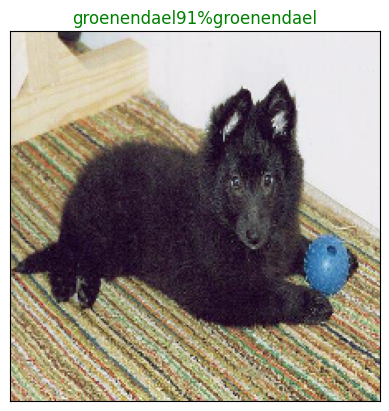

In [121]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=77)

Now we have got a function to visualize our model top prediction.Let's make another to view our models top 10 predictions.
This function will take:
1. take an input of prediction probabilities array and a ground truth array and an integer.
2. Find the prediction using get_pred_label()
3. find the top 10
   . Prediction probabilities indexes
   . Prediction probabibity values
   . prediction labels
4. PLot the top 10 prediction probability values and labels,colouring the true label green.

In [122]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob,true_label = prediction_probabilities[n],labels[n]
  # get the prediction label
  pred_label = get_pred_label(pred_prob)
  #find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  #find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  #find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  #setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),labels = top_10_pred_labels,rotation="vertical")
  #change color of the true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

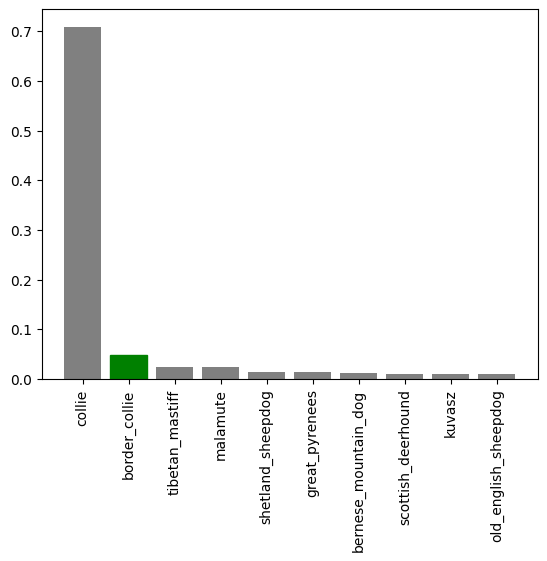

In [123]:
plot_pred_conf(prediction_probabilities = predictions,labels = val_labels,n=9)

Now we have got some functions to help us to visualize our predictions and evaluate our model,lets check out

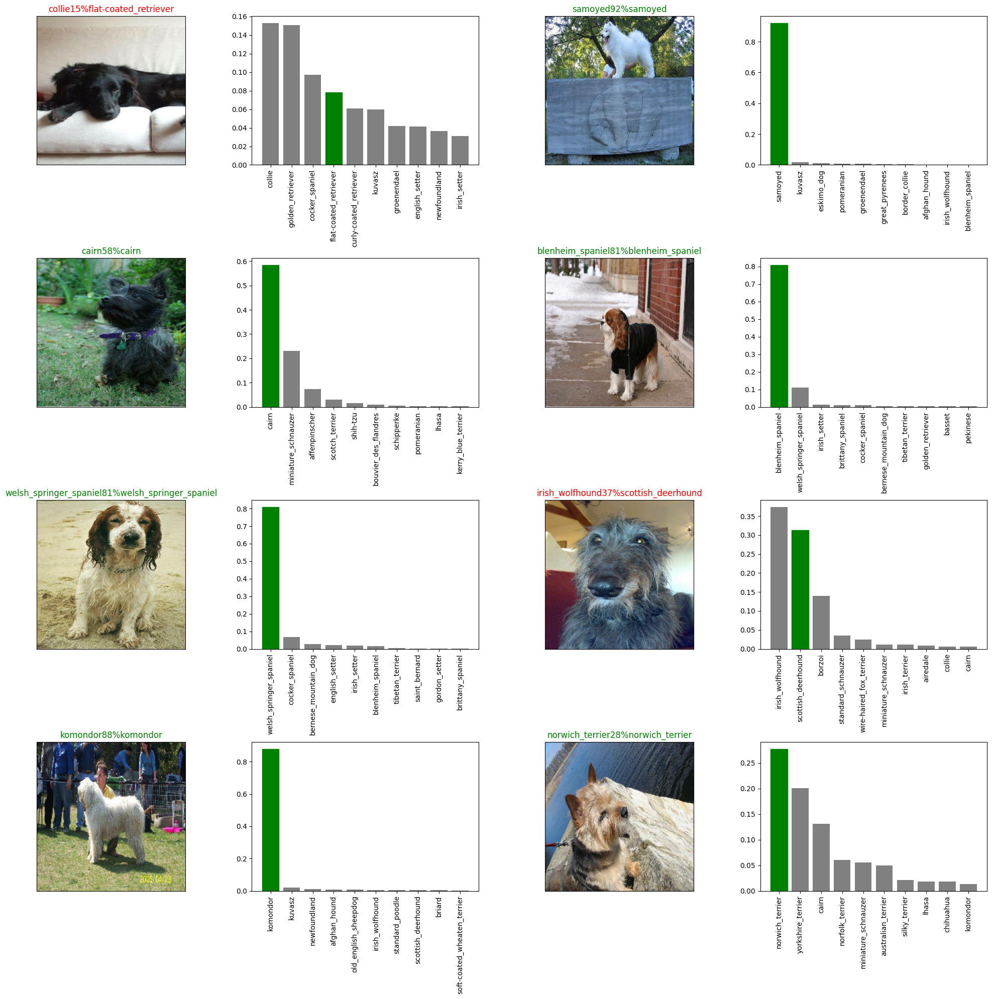

In [124]:
#Lets check out few predictions and thir different values
i_multiplier = 20
num_rows = 4
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [125]:
#create a function to save our model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity.
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [126]:
# create a function to load model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf_keras.models.load_model(model_path,custom_objects = {"KerasLayer":hub.KerasLayer})
  return model

In [127]:
#save our model on 1000 images
save_model(model,"1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/dog vision/models/20241111-06251731306316-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/dog vision/models/20241111-06251731306316-1000-images-mobilenetv2-Adam.h5'

In [128]:
#load a trained model
loaded_1000_image_model = load_model('drive/My Drive/dog vision/models/20241110-05091731215349-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/dog vision/models/20241110-05091731215349-1000-images-mobilenetv2-Adam.h5


In [129]:
#Evaluate the pre saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 109ms/step - loss: 1.2353 - accuracy: 0.6950


[1.235334038734436, 0.6949999928474426]

In [130]:
#evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 101ms/step - loss: 1.2332 - accuracy: 0.6750


[1.2332472801208496, 0.675000011920929]

## training the big dog model on 10000 images

In [131]:
len(x) , len(y)

(10222, 10222)

In [132]:
x[:10]

['drive/My Drive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [133]:
x_train

['drive/My Drive/dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/My Drive/dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/My Drive/dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/My Drive/dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/My Drive/dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 'drive/My Drive/dog vision/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 'drive/My Drive/dog vision/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 'drive/My Drive/dog vision/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 'drive/My Drive/dog vision/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 'drive/My Drive/dog vision/train/143b9484273e57668d03bfc26755810a.jpg',
 'drive/My Drive/dog vision/train/019ff93e03802e661577b5869e099dcb.jpg',
 'drive/My Drive/dog vision/train/035f28d8ad34afaf7c8d276d6674bf8f.jpg',
 'drive/My Drive/dog vision/train/16ac25747d1a51db033d6461156ddb0b.jpg',
 'drive/My Drive/dog vision/train/14597c96d5c222eeb

In [134]:
len(x_train)

800

In [135]:
# create a data batch with full data set
full_data = create_data_batches(x,y)

Creating training data batches....


In [136]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [137]:
#create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [138]:
#create full model call backs
full_model_tensorboard = create_tensorboard_callback()
#no validation set when training with full data,so we cant monitor validation accuracy.
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

running the cell may take a liitle while.
(maybe upto 30 minutes for the first epoch.
GPU we are using in the runtime has to load all the data into memory.)

In [ ]:
# fit the full model to full data
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])


Epoch 1/100
320/320 [==============================] - 52s 135ms/step - loss: 1.3195 - accuracy: 0.6692
Epoch 2/100
320/320 [==============================] - 41s 127ms/step - loss: 0.3989 - accuracy: 0.8804
Epoch 3/100
320/320 [==============================] - 44s 137ms/step - loss: 0.2345 - accuracy: 0.9344
Epoch 4/100
320/320 [==============================] - 44s 139ms/step - loss: 0.1553 - accuracy: 0.9619
Epoch 5/100
320/320 [==============================] - 43s 134ms/step - loss: 0.1027 - accuracy: 0.9808
Epoch 6/100
320/320 [==============================] - 45s 139ms/step - loss: 0.0750 - accuracy: 0.9876
Epoch 7/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0579 - accuracy: 0.9926
Epoch 8/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0453 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0379 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 44s 136m

In [139]:
save_model(full_model,suffix="full-10000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/dog vision/models/20241111-06261731306387-full-10000-images-mobilenetv2-Adam.h5...


'drive/My Drive/dog vision/models/20241111-06261731306387-full-10000-images-mobilenetv2-Adam.h5'

In [146]:
loaded_full_model=load_model('drive/My Drive/dog vision/models/20241111-06261731306387-full-10000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/dog vision/models/20241111-06261731306387-full-10000-images-mobilenetv2-Adam.h5


## Making predictions on test dataset

since our model is trained on the images that are in the form of tensors,to make predictions on test data, it should be also in the form of tensors.

we earlier created function create_data_batches()  earlier which can take a list of filenames as input and convert them into batches.

to make predictions:
1. get the test image filename
2. convert the filename into test data batches using "create_data_batches()" function and setting the test_data parameter to true(since test_data dioesnot have labels).
3. Maka a prediction array by passing the test batches to the predict() method called on our model.


In [147]:
#load test image file names
test_path = "drive/MyDrive/dog vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
#i.e gets appended test_path everytime
test_filenames[:10]

['drive/MyDrive/dog vision/test/e19900119c7d3ce48d4035cd0211be72.jpg',
 'drive/MyDrive/dog vision/test/e09a3a40b2ebdf0be72800eefd6931de.jpg',
 'drive/MyDrive/dog vision/test/e5507ebc0e05513bf543e160a484666f.jpg',
 'drive/MyDrive/dog vision/test/e59d59ffbb65d9eae166d4068af5d9b9.jpg',
 'drive/MyDrive/dog vision/test/e4e57083c3b68e91760ce6f5fcd0a2f9.jpg',
 'drive/MyDrive/dog vision/test/de327414ced20d4e6f786a68bff82e10.jpg',
 'drive/MyDrive/dog vision/test/e17defebd1b8fc39e9c3c10df3c2e3de.jpg',
 'drive/MyDrive/dog vision/test/e26901a9e04f0ba89765fb9b9b7f675f.jpg',
 'drive/MyDrive/dog vision/test/de291f05facd9c7db8d4880a0c84263b.jpg',
 'drive/MyDrive/dog vision/test/dda9df5ec2de82082127c99052fd077b.jpg']

In [148]:
len(test_filenames)

10357

In [149]:
#create test data batch
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [150]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

### **Note:** calling predict() on our  full model and passing test data batch will take a long time.(about 1 hour)

In [151]:
#Make predictions on test data batches using the loaded full model
# I actually misspelled previously loaded_full_model as loaded_fill_model.
test_predictions = loaded_full_model.predict(test_data,verbose = 1)

324/324 [==============================] - 345s 1s/step


In [152]:
test_predictions[:10]

array([[0.01059963, 0.0116534 , 0.00012606, ..., 0.00613116, 0.00100426,
        0.00103896],
       [0.00102508, 0.01065007, 0.0055633 , ..., 0.00445691, 0.00034512,
        0.00662786],
       [0.00559183, 0.00053777, 0.00262334, ..., 0.05339951, 0.0064991 ,
        0.00162037],
       ...,
       [0.01159407, 0.08290338, 0.00071632, ..., 0.01114511, 0.00064739,
        0.0064483 ],
       [0.01197593, 0.00805873, 0.00122654, ..., 0.00691633, 0.00040916,
        0.00145877],
       [0.00329021, 0.00120119, 0.00698454, ..., 0.00792525, 0.00091744,
        0.0052817 ]], dtype=float32)

In [153]:
test_predictions[:10].shape

(10, 120)

In [154]:
test_predictions[0]

array([1.0599628e-02, 1.1653399e-02, 1.2605832e-04, 1.9642910e-01,
       9.9790134e-03, 6.3600432e-04, 8.9325290e-03, 2.2584447e-03,
       4.5257949e-04, 7.2794966e-04, 3.0570684e-03, 1.7392731e-03,
       6.7095384e-03, 7.0991984e-04, 1.0707037e-02, 9.8085618e-03,
       1.7697065e-03, 7.7943625e-03, 1.8076630e-03, 2.7822878e-03,
       3.0015712e-03, 7.3617129e-03, 7.7655418e-03, 4.4911127e-03,
       5.6531853e-03, 1.4329087e-02, 2.8070903e-03, 6.1264616e-03,
       7.2418968e-04, 6.1662220e-03, 3.1034090e-03, 3.5010262e-03,
       2.1934796e-02, 3.1142810e-03, 2.8231008e-02, 2.5463940e-03,
       5.1019462e-03, 1.4691628e-03, 2.2853168e-03, 2.9993292e-03,
       3.8817464e-03, 1.4726677e-02, 1.0238407e-03, 1.3038424e-03,
       2.0245204e-02, 1.1660585e-02, 7.5680148e-03, 2.5219349e-03,
       7.2574639e-04, 1.8221194e-04, 1.1859512e-03, 4.5729689e-02,
       1.6480737e-03, 4.4604051e-03, 9.0005918e-04, 1.2803260e-02,
       7.9724711e-04, 4.5427005e-03, 1.4350907e-03, 2.8188427e

In [155]:
#lets get max value and corresponding breed name for the predictions[0]

np.max(test_predictions[0])

0.1964291

In [156]:
#for above np.max(test_predictions[0]), lets get the actual breed name
unique_breeds[np.argmax(test_predictions[0])]

'airedale'

In [157]:
#lets verify whether its true or not
get_pred_label(test_predictions[0])

'airedale'

In [158]:
#create a pandas DataFrame with empty columns
["id"]+list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [159]:
preds_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [162]:
#append test images to the dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [163]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/dog vision/test/e19900119c7d3ce48d4035cd0211be72', '.jpg')

In [164]:
test_ids


['e19900119c7d3ce48d4035cd0211be72',
 'e09a3a40b2ebdf0be72800eefd6931de',
 'e5507ebc0e05513bf543e160a484666f',
 'e59d59ffbb65d9eae166d4068af5d9b9',
 'e4e57083c3b68e91760ce6f5fcd0a2f9',
 'de327414ced20d4e6f786a68bff82e10',
 'e17defebd1b8fc39e9c3c10df3c2e3de',
 'e26901a9e04f0ba89765fb9b9b7f675f',
 'de291f05facd9c7db8d4880a0c84263b',
 'dda9df5ec2de82082127c99052fd077b',
 'e6f07d64c2380bbde03a7b6ade01b859',
 'ef1710d5cb79a5e0b46f7b9a101a25b4',
 'f53ae57b0cae92b14f87716a815d66e9',
 'f1230a99088c9bc88bc2989affee43d2',
 'e850770a6575a34b1c7ad4b401692553',
 'f12b509213db8bb0a721fcd228b31f0e',
 'ed61910363f37890c8cc47b25836f82e',
 'f30f7155fd94e7f0d3621d9cc9031e93',
 'f2e4e4f1ab9d156443682dc4653f23e5',
 'f0154b8ea1efd5dfb70e43fada42e56d',
 'ea6acca2c050c1f782cf020bb6aba4aa',
 'ed67681e7935d75f9ce011dbf8474fe4',
 'e83fec66a32873298df9fa5fdac113aa',
 'f3a99ce58c3efc75fe2377be02c545f9',
 'f446eac396b0e74af84fab5069d28c68',
 'e93e61b16ed9e22d35046ae7900b0647',
 'f232ed4d2958c9b13ec8922933a852e4',
 

In [165]:
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e19900119c7d3ce48d4035cd0211be72,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e09a3a40b2ebdf0be72800eefd6931de,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e5507ebc0e05513bf543e160a484666f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e59d59ffbb65d9eae166d4068af5d9b9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e4e57083c3b68e91760ce6f5fcd0a2f9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [166]:
preds_df[list(unique_breeds)] = test_predictions
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e19900119c7d3ce48d4035cd0211be72,0.010600,0.011653,0.000126,0.196429,0.009979,0.000636,0.008933,0.002258,0.000453,...,0.034237,0.005952,0.004594,0.009683,0.003825,0.008673,0.003330,0.006131,0.001004,0.001039
1,e09a3a40b2ebdf0be72800eefd6931de,0.001025,0.010650,0.005563,0.010659,0.000762,0.001259,0.003720,0.000414,0.007227,...,0.003866,0.007661,0.001795,0.001302,0.002895,0.003954,0.001724,0.004457,0.000345,0.006628
2,e5507ebc0e05513bf543e160a484666f,0.005592,0.000538,0.002623,0.013049,0.003067,0.003983,0.003261,0.015775,0.001475,...,0.006633,0.000837,0.016202,0.002438,0.044631,0.001561,0.005552,0.053400,0.006499,0.001620
3,e59d59ffbb65d9eae166d4068af5d9b9,0.014133,0.000036,0.000367,0.033827,0.000876,0.005283,0.089807,0.010991,0.002682,...,0.010648,0.005668,0.018572,0.006025,0.009143,0.001780,0.000837,0.001976,0.026496,0.001573
4,e4e57083c3b68e91760ce6f5fcd0a2f9,0.005314,0.010318,0.000555,0.125507,0.007733,0.003128,0.000591,0.005315,0.001111,...,0.011401,0.006174,0.004472,0.008639,0.007147,0.017224,0.010593,0.004674,0.002826,0.000469
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,078a52db2d156257696c771487a6a316,0.000968,0.001331,0.001688,0.011328,0.001088,0.001148,0.006578,0.002242,0.005060,...,0.001032,0.001726,0.000913,0.000236,0.002167,0.003285,0.001316,0.013723,0.002949,0.029759
10353,0770fe4187dd10984ea1afa07757dc8c,0.037395,0.004158,0.010812,0.038084,0.002773,0.002047,0.001883,0.003099,0.002741,...,0.005875,0.004095,0.008688,0.142183,0.001552,0.012217,0.004223,0.017446,0.001051,0.001227
10354,07ae657216e11b5b5d78d89faca53314,0.000561,0.000394,0.007702,0.035460,0.003922,0.000887,0.000241,0.087040,0.002889,...,0.003842,0.000297,0.007112,0.009199,0.082665,0.002365,0.003000,0.002619,0.006509,0.001710
10355,078f84bedc233aec44cad8a333be7e83,0.000107,0.003507,0.002571,0.014365,0.010590,0.007851,0.000409,0.010514,0.000910,...,0.002410,0.003164,0.005796,0.007019,0.095468,0.007984,0.013180,0.001810,0.006415,0.000270


In [167]:
#save our model to csv
preds_df.to_csv("drive/My Drive/dog vision/full_model_predictions_submission_1_mobilenetV2.csv",index=False)

In [168]:
#making predictions on our custom images
custom_path = "drive/MyDrive/dog vision/mydogimages/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/MyDrive/dog vision/mydogimages/laborador.jpeg']

In [169]:
#turn custom images
custom_data = create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [170]:
#make predictions on custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

1/1 [==============================] - 1s 1s/step


array([[1.37719838e-03, 4.83034775e-02, 3.70911759e-04, 3.90878093e-04,
        2.48614419e-03, 3.49851558e-03, 7.74093322e-04, 2.12855283e-02,
        5.90815814e-03, 5.73305134e-03, 2.65279133e-03, 9.43352189e-03,
        2.44736788e-03, 1.70364452e-04, 8.58164765e-03, 1.08464085e-03,
        2.52927206e-02, 8.56052618e-04, 3.42016458e-03, 1.96835585e-03,
        5.86442184e-03, 2.47393991e-03, 1.91943080e-04, 7.23981997e-04,
        5.51811419e-03, 4.11398150e-03, 1.16460673e-04, 1.61357835e-04,
        4.53137979e-03, 1.58515782e-03, 1.22437701e-02, 4.63043369e-04,
        1.34661270e-03, 7.54097884e-04, 7.55698010e-02, 1.08978776e-02,
        1.38209630e-02, 7.55493995e-04, 2.30241776e-03, 9.54056683e-04,
        7.90085457e-03, 1.49810250e-04, 1.46998500e-03, 3.50138894e-03,
        2.07902920e-02, 1.17835812e-02, 3.57811898e-02, 9.33048490e-04,
        1.63451163e-03, 2.03908309e-02, 2.32527927e-02, 6.54234434e-04,
        1.84390262e-01, 4.22715384e-04, 3.80477257e-04, 1.505379

In [171]:
np.argmax(custom_preds)

52

In [172]:
unique_breeds[np.argmax(custom_preds)]


'great_pyrenees'

In [173]:
custom_preds_label = get_pred_label(custom_preds)
custom_preds_label

'great_pyrenees'

In [175]:
# get our custom image (our unbatchify() function will not worksince there arent labels .... may be we could fix this later)
custom_images=[]
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

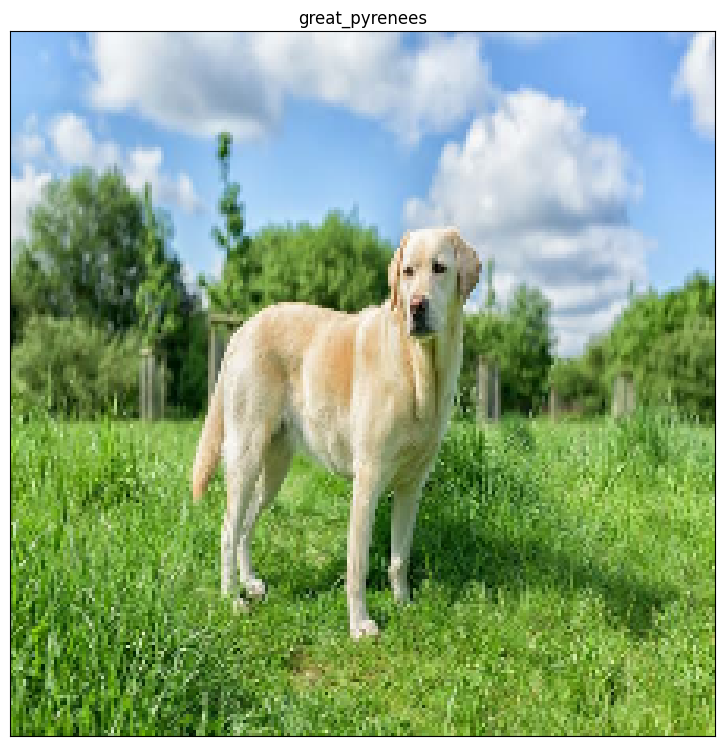

In [181]:
#check custom image predictions
plt.figure(figsize=(20,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,2,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_label)
  plt.imshow(image)